In [1]:
## Import necessary libraries
import numpy as np
import pandas as pd

## Import matplotlib for basic plotting
import matplotlib.pyplot as plt
from matplotlib import colors

## Import seaborn for statistical data visualization
import seaborn as sns

## Import plotly for interactive visualizations
import plotly.express as px
import plotly.io as pio


In [2]:
## Set Pandas to display all columns in DataFrame
pd.set_option('display.max_columns', None)
## Set the default template for Plotly visualizations
pio.templates.default = "ggplot2"
## Set seaborn settings for plot aesthetics
sns.set(rc={"figure.figsize" : [25,25]}, font_scale=1.2)
sns.set(rc={"axes.facecolor":"#FFF9ED","figure.facecolor":"#FFF9ED"})
## Define a custom color palette for seaborn
palette = ["#007B7F", "#A2D5C6", "#FF6B6B", "#B392AC", "#00203F", "#FFD166"]
sns.set_palette(palette)
## Create a color map for matplotlib using the defined palette
color_map = colors.ListedColormap(palette)

In [3]:
# Loading the data sets 
raw_data = pd.read_csv("/kaggle/input/world-food-production/world food production.csv")
print(raw_data.columns)
print("--"*50)
print(raw_data.shape)

Index(['Entity', 'Year', 'Maize Production (tonnes)',
       'Rice  Production ( tonnes)', 'Yams  Production (tonnes)',
       'Wheat Production (tonnes)', 'Tomatoes Production (tonnes)',
       'Tea  Production ( tonnes )', 'Sweet potatoes  Production (tonnes)',
       'Sunflower seed  Production (tonnes)', 'Sugar cane Production (tonnes)',
       'Soybeans  Production (tonnes)', 'Rye  Production (tonnes)',
       'Potatoes  Production (tonnes)', 'Oranges  Production (tonnes)',
       'Peas, dry Production ( tonnes)', 'Palm oil  Production (tonnes)',
       'Grapes  Production (tonnes)', 'Coffee, green Production ( tonnes)',
       'Cocoa beans Production (tonnes)', 'Meat, chicken  Production (tonnes)',
       'Bananas  Production ( tonnes)', 'Avocados Production (tonnes)',
       'Apples Production (tonnes)'],
      dtype='object')
----------------------------------------------------------------------------------------------------
(11912, 24)


In [4]:
raw_data.head(2)

,Entity,Year,Maize Production (tonnes),Rice Production ( tonnes),Yams Production (tonnes),Wheat Production (tonnes),Tomatoes Production (tonnes),Tea Production ( tonnes ),Sweet potatoes Production (tonnes),Sunflower seed Production (tonnes),Sugar cane Production (tonnes),Soybeans Production (tonnes),Rye Production (tonnes),Potatoes Production (tonnes),Oranges Production (tonnes),"Peas, dry Production ( tonnes)",Palm oil Production (tonnes),Grapes Production (tonnes),"Coffee, green Production ( tonnes)",Cocoa beans Production (tonnes),"Meat, chicken Production (tonnes)",Bananas Production ( tonnes),Avocados Production (tonnes),Apples Production (tonnes)
0,Afghanistan,1961,700000.0,319000.0,7467702.0,2279000.0,1873812.0,56315.0,3270871.0,12000.0,45000.0,71813.0,10290.0,130000.0,10100.0,232910.0,1131882.0,225000.0,870970.0,835368.0,5600.0,3139079.0,63439.0,15100.0
1,Afghanistan,1962,700000.0,319000.0,7420515.0,2279000.0,2044797.0,61519.0,3562524.0,12800.0,45000.0,84594.0,9100.0,115000.0,10100.0,259412.0,1111006.0,225000.0,883512.0,867170.0,6000.0,3181580.0,65118.0,15100.0


In [5]:
raw_data.dtypes

Entity                                  object
Year                                     int64
Maize Production (tonnes)              float64
Rice  Production ( tonnes)             float64
Yams  Production (tonnes)              float64
Wheat Production (tonnes)              float64
Tomatoes Production (tonnes)           float64
Tea  Production ( tonnes )             float64
Sweet potatoes  Production (tonnes)    float64
Sunflower seed  Production (tonnes)    float64
Sugar cane Production (tonnes)         float64
Soybeans  Production (tonnes)          float64
Rye  Production (tonnes)               float64
Potatoes  Production (tonnes)          float64
Oranges  Production (tonnes)           float64
Peas, dry Production ( tonnes)         float64
Palm oil  Production (tonnes)          float64
Grapes  Production (tonnes)            float64
Coffee, green Production ( tonnes)     float64
Cocoa beans Production (tonnes)        float64
Meat, chicken  Production (tonnes)     float64
Bananas  Prod

### There are actually only one categorical column and most of them are numerical in nature

In [6]:
raw_data.describe().T.style.background_gradient(cmap=color_map) ## Statistical info. about numerical columns..

,count,mean,std,min,25%,50%,75%,max
Year,11912.000000,1992.115346,17.606091,1961.000000,1977.000000,1993.000000,2007.000000,2021.000000
Maize Production (tonnes),11912.000000,19264341.323436,70280220.257147,0.000000,23793.000000,400049.000000,4979875.250000,1210235100.000000
Rice Production ( tonnes),11912.000000,22545415.653228,77497792.957072,0.000000,39024.750000,454374.500000,4440542.000000,787293900.000000
Yams Production (tonnes),11912.000000,2744972.759715,8787786.377797,0.000000,11762.500000,123605.488000,572103.000000,78714050.000000
Wheat Production (tonnes),11912.000000,23656842.935758,61778994.725724,0.000000,88925.000000,1650000.000000,15241489.750000,772305500.000000
Tomatoes Production (tonnes),11912.000000,3238661.287602,11469918.592770,0.000000,12500.000000,129141.000000,869135.750000,189133950.000000
Tea Production ( tonnes ),11912.000000,135052.339708,254426.367516,10.000000,2040.000000,25645.500000,119267.450000,2524670.000000
Sweet potatoes Production (tonnes),11912.000000,5021303.142203,20016916.926470,0.000000,7082.605000,78284.000000,747221.600000,152861970.000000
Sunflower seed Production (tonnes),11912.000000,1410296.521702,3625725.392446,0.000000,15376.750000,148150.350000,1115601.600000,58185630.000000
Sugar cane Production (tonnes),11912.000000,52184114.115827,152708453.121158,0.000000,331210.000000,3275769.800000,25072266.800000,1958233500.000000


In [7]:
raw_data.describe(include="object").T ## Statistical info. about Categorical columns..

,count,unique,top,freq
Entity,11912,226,Afghanistan,61


In [8]:
# Concatenate the count of null values and the percentage of null values into a single DataFrame
nullsFrame = pd.concat([raw_data.isnull().sum(), round(raw_data.isnull().mean() * 100,2)],
                       axis=1,
                       keys=["Count", "Percentage"])

## print the nullsFrame
print(f"The Data Frame of Missing Values in the Data : \n {nullsFrame}")

The Data Frame of Missing Values in the Data : 
                                      Count  Percentage
Entity                                   0         0.0
Year                                     0         0.0
Maize Production (tonnes)                0         0.0
Rice  Production ( tonnes)               0         0.0
Yams  Production (tonnes)                0         0.0
Wheat Production (tonnes)                0         0.0
Tomatoes Production (tonnes)             0         0.0
Tea  Production ( tonnes )               0         0.0
Sweet potatoes  Production (tonnes)      0         0.0
Sunflower seed  Production (tonnes)      0         0.0
Sugar cane Production (tonnes)           0         0.0
Soybeans  Production (tonnes)            0         0.0
Rye  Production (tonnes)                 0         0.0
Potatoes  Production (tonnes)            0         0.0
Oranges  Production (tonnes)             0         0.0
Peas, dry Production ( tonnes)           0         0.0
Palm oil  Produc

## There are no missing values in the given dataset. 

In [9]:
raw_data.duplicated().any()

False

### This proves that there are no duplicates in the dataset

In [10]:
raw_data.nunique()

Entity                                  226
Year                                     61
Maize Production (tonnes)              9789
Rice  Production ( tonnes)             9652
Yams  Production (tonnes)              7285
Wheat Production (tonnes)              9946
Tomatoes Production (tonnes)           9393
Tea  Production ( tonnes )             4744
Sweet potatoes  Production (tonnes)    8445
Sunflower seed  Production (tonnes)    7739
Sugar cane Production (tonnes)         8783
Soybeans  Production (tonnes)          8089
Rye  Production (tonnes)               7436
Potatoes  Production (tonnes)          9921
Oranges  Production (tonnes)           8651
Peas, dry Production ( tonnes)         8336
Palm oil  Production (tonnes)          5899
Grapes  Production (tonnes)            8926
Coffee, green Production ( tonnes)     7882
Cocoa beans Production (tonnes)        6898
Meat, chicken  Production (tonnes)     8850
Bananas  Production ( tonnes)          8352
Avocados Production (tonnes)    

In [11]:
raw_data.columns

Index(['Entity', 'Year', 'Maize Production (tonnes)',
       'Rice  Production ( tonnes)', 'Yams  Production (tonnes)',
       'Wheat Production (tonnes)', 'Tomatoes Production (tonnes)',
       'Tea  Production ( tonnes )', 'Sweet potatoes  Production (tonnes)',
       'Sunflower seed  Production (tonnes)', 'Sugar cane Production (tonnes)',
       'Soybeans  Production (tonnes)', 'Rye  Production (tonnes)',
       'Potatoes  Production (tonnes)', 'Oranges  Production (tonnes)',
       'Peas, dry Production ( tonnes)', 'Palm oil  Production (tonnes)',
       'Grapes  Production (tonnes)', 'Coffee, green Production ( tonnes)',
       'Cocoa beans Production (tonnes)', 'Meat, chicken  Production (tonnes)',
       'Bananas  Production ( tonnes)', 'Avocados Production (tonnes)',
       'Apples Production (tonnes)'],
      dtype='object')

In [12]:
categorical_data=raw_data.select_dtypes(include="object")

In [13]:
numeric_data=raw_data.select_dtypes(exclude="object")

In [14]:
numeric_data.head(2)

,Year,Maize Production (tonnes),Rice Production ( tonnes),Yams Production (tonnes),Wheat Production (tonnes),Tomatoes Production (tonnes),Tea Production ( tonnes ),Sweet potatoes Production (tonnes),Sunflower seed Production (tonnes),Sugar cane Production (tonnes),Soybeans Production (tonnes),Rye Production (tonnes),Potatoes Production (tonnes),Oranges Production (tonnes),"Peas, dry Production ( tonnes)",Palm oil Production (tonnes),Grapes Production (tonnes),"Coffee, green Production ( tonnes)",Cocoa beans Production (tonnes),"Meat, chicken Production (tonnes)",Bananas Production ( tonnes),Avocados Production (tonnes),Apples Production (tonnes)
0,1961,700000.0,319000.0,7467702.0,2279000.0,1873812.0,56315.0,3270871.0,12000.0,45000.0,71813.0,10290.0,130000.0,10100.0,232910.0,1131882.0,225000.0,870970.0,835368.0,5600.0,3139079.0,63439.0,15100.0
1,1962,700000.0,319000.0,7420515.0,2279000.0,2044797.0,61519.0,3562524.0,12800.0,45000.0,84594.0,9100.0,115000.0,10100.0,259412.0,1111006.0,225000.0,883512.0,867170.0,6000.0,3181580.0,65118.0,15100.0


In [15]:
numeric_data.describe()

,Year,Maize Production (tonnes),Rice Production ( tonnes),Yams Production (tonnes),Wheat Production (tonnes),Tomatoes Production (tonnes),Tea Production ( tonnes ),Sweet potatoes Production (tonnes),Sunflower seed Production (tonnes),Sugar cane Production (tonnes),Soybeans Production (tonnes),Rye Production (tonnes),Potatoes Production (tonnes),Oranges Production (tonnes),"Peas, dry Production ( tonnes)",Palm oil Production (tonnes),Grapes Production (tonnes),"Coffee, green Production ( tonnes)",Cocoa beans Production (tonnes),"Meat, chicken Production (tonnes)",Bananas Production ( tonnes),Avocados Production (tonnes),Apples Production (tonnes)
count,11912.000000,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04,1.191200e+04
mean,1992.115346,1.926434e+07,2.254542e+07,2.744973e+06,2.365684e+07,3.238661e+06,1.350523e+05,5.021303e+06,1.410297e+06,5.218411e+07,7.902080e+06,1.898678e+06,1.225079e+07,2.176532e+06,6.375701e+05,1.502615e+06,3.623623e+06,3.549990e+05,2.191661e+05,1.165719e+06,2.653282e+06,1.564768e+05,3.260419e+06
std,17.606091,7.028022e+07,7.749779e+07,8.787786e+06,6.177899e+07,1.146992e+07,2.544264e+05,2.001692e+07,3.625725e+06,1.527085e+08,2.773782e+07,4.547930e+06,3.684243e+07,6.078086e+06,1.527103e+06,6.144476e+06,8.225799e+06,8.785398e+05,5.835509e+05,4.050976e+06,8.178866e+06,4.239785e+05,8.748227e+06
min,1961.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1977.000000,2.379300e+04,3.902475e+04,1.176250e+04,8.892500e+04,1.250000e+04,2.040000e+03,7.082605e+03,1.537675e+04,3.312100e+05,3.811000e+03,1.901889e+04,3.447150e+04,1.182728e+04,5.196345e+03,1.384195e+04,6.757700e+04,3.119250e+03,1.092024e+03,3.882640e+03,1.007145e+04,3.681500e+03,4.431650e+04
50%,1993.000000,4.000490e+05,4.543745e+05,1.236055e+05,1.650000e+06,1.291410e+05,2.564550e+04,7.828400e+04,1.481504e+05,3.275770e+06,8.458344e+04,1.748645e+05,4.880545e+05,1.469060e+05,4.755700e+04,7.887600e+04,4.680664e+05,3.229550e+04,9.160000e+03,3.659000e+04,1.508370e+05,3.577800e+04,4.222070e+05
75%,2007.000000,4.979875e+06,4.440542e+06,5.721030e+05,1.524149e+07,8.691358e+05,1.192675e+05,7.472216e+05,1.115602e+06,2.507227e+07,1.019846e+06,1.020084e+06,3.615307e+06,1.434050e+06,4.269712e+05,4.145059e+05,3.080176e+06,2.126140e+05,1.250475e+05,3.547400e+05,1.187962e+06,1.160314e+05,1.950000e+06
max,2021.000000,1.210235e+09,7.872939e+08,7.871405e+07,7.723055e+08,1.891340e+08,2.524670e+06,1.528620e+08,5.818563e+07,1.958234e+09,3.716936e+08,3.819358e+07,3.761200e+08,7.656665e+07,1.663746e+07,7.906779e+07,8.001590e+07,1.079544e+07,5.780850e+06,5.017566e+07,1.249786e+08,8.685672e+06,9.314436e+07


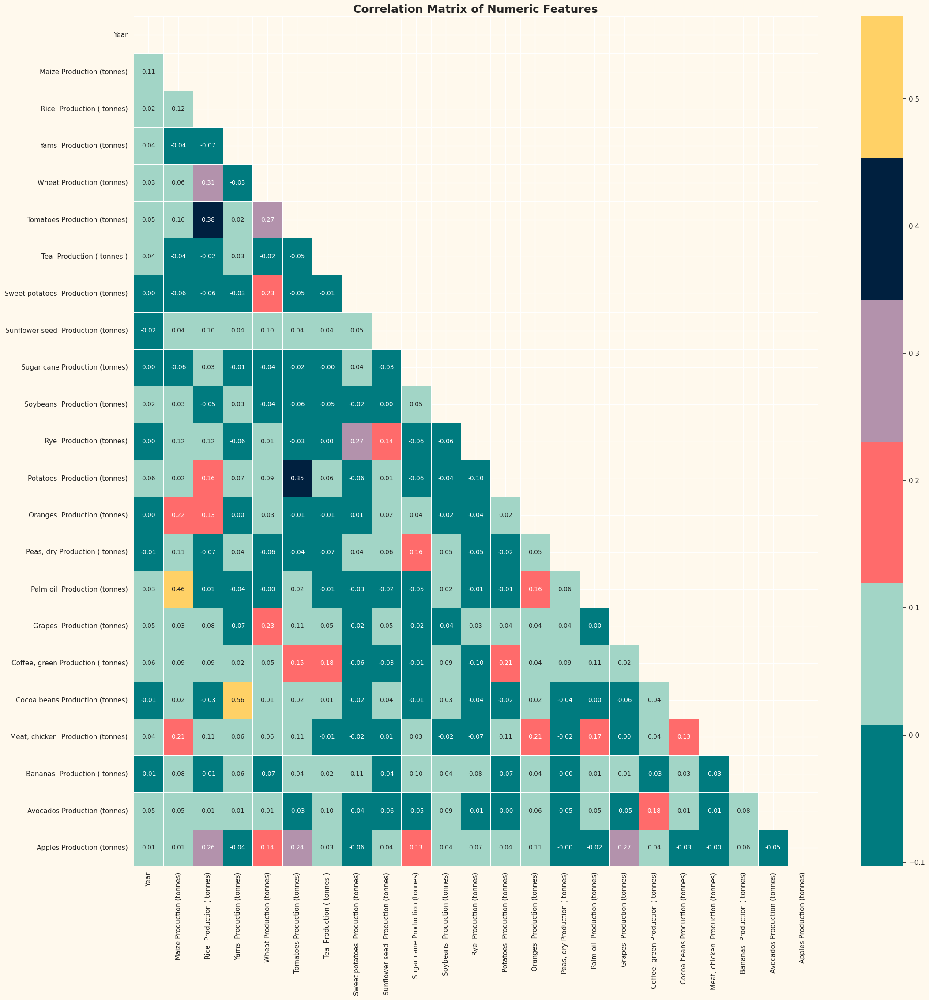

In [16]:
## correlation matrix
correlation_matrix = raw_data.corr(numeric_only=True)

## mask
mask = np.triu(np.ones_like(raw_data.corr(numeric_only=True)))


## heatmap
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap=color_map, fmt=".2f",
            annot_kws={'size': 10}, linewidths=0.5, cbar=True)

## title
plt.title("Correlation Matrix of Numeric Features", fontsize=18, weight="bold")

## Show the plot
plt.show()

## This correlation Matrix Shows that Palm oil production and Maize Production are close to 50% Correlated to each other.

## Coco beans and Yams Prodcutions are over 50% Correlated. This tells us that Palm oil and Maize production are directlu proportional to each other and the same goes for cocoa beans and yams production

In [17]:
numeric_data

,Year,Maize Production (tonnes),Rice Production ( tonnes),Yams Production (tonnes),Wheat Production (tonnes),Tomatoes Production (tonnes),Tea Production ( tonnes ),Sweet potatoes Production (tonnes),Sunflower seed Production (tonnes),Sugar cane Production (tonnes),Soybeans Production (tonnes),Rye Production (tonnes),Potatoes Production (tonnes),Oranges Production (tonnes),"Peas, dry Production ( tonnes)",Palm oil Production (tonnes),Grapes Production (tonnes),"Coffee, green Production ( tonnes)",Cocoa beans Production (tonnes),"Meat, chicken Production (tonnes)",Bananas Production ( tonnes),Avocados Production (tonnes),Apples Production (tonnes)
0,1961,700000.0,319000.00,7.467702e+06,2279000.00,1873812.000,56315.0,3270871.000,12000.000,45000.0,71813.000,10290.000,130000.000,10100.000,232910.000,1131882.00,2.250000e+05,870970.000,835368.000,5600.00,3139079.000,63439.000,15100.000
1,1962,700000.0,319000.00,7.420515e+06,2279000.00,2044797.000,61519.0,3562524.000,12800.000,45000.0,84594.000,9100.000,115000.000,10100.000,259412.000,1111006.00,2.250000e+05,883512.000,867170.000,6000.00,3181580.000,65118.000,15100.000
2,1963,713000.0,319000.00,8.479074e+06,1947000.00,2096077.000,63596.0,3409916.000,12800.000,45000.0,87260.000,13800.000,122000.000,10100.000,251529.000,1145004.00,2.250000e+05,996674.000,922621.000,6160.00,3304256.000,61760.000,15100.000
3,1964,720000.0,380000.00,9.113779e+06,2230000.00,2388264.000,66604.0,3229336.000,12800.000,45000.0,76781.000,16100.000,129000.000,12400.000,247556.000,1160831.00,2.650000e+05,1162048.000,1190061.000,6400.00,3392527.000,62759.000,18400.000
4,1965,720000.0,380000.00,1.006791e+07,2282000.00,2559608.000,72418.0,3169104.000,13200.000,51000.0,73067.000,13900.000,132000.000,13700.000,266947.000,1138860.00,2.870000e+05,1075084.000,874245.000,6800.00,3450849.000,66269.000,20400.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11907,2017,1532572.0,20502618.00,2.673608e+05,30991516.16,324020.864,83904.6,874.408,4077308.066,11691968.0,56981.348,39390.000,1343391.240,129055.800,40749.600,661978.98,7.018985e+06,63.200,34945.000,75000.00,1267.200,145042.096,1579154.000
11908,2018,1560100.0,31871776.60,2.667498e+05,16884482.98,309316.252,66842.6,1383.792,2107639.306,6262598.8,33201.948,395575.200,1343300.160,168074.000,21606.400,485223.38,3.415107e+06,68.000,34659.800,80357.14,1016.776,143384.384,907419.000
11909,2019,773976.0,3382151.40,4.790022e+05,64989733.20,540128.592,9854.4,298831.560,3320915.400,91068370.0,2757526.764,4971651.868,1734927.992,1134136.812,45436.400,361128.20,9.645766e+06,30401.400,20961.132,79790.97,195845.198,525095.272,3117813.560
11910,2020,1202347.0,3535631.80,7.437612e+05,43020887.20,5635740.200,276279.0,1727311.800,983256.000,139404061.2,63693.080,18641.028,4414078.400,72179.400,12023.200,279613.40,1.131937e+07,574723.374,158022.122,8000.00,1523258.600,28946.840,7994169.220


In [18]:
numeric_data.groupby('Year').median()

,Maize Production (tonnes),Rice Production ( tonnes),Yams Production (tonnes),Wheat Production (tonnes),Tomatoes Production (tonnes),Tea Production ( tonnes ),Sweet potatoes Production (tonnes),Sunflower seed Production (tonnes),Sugar cane Production (tonnes),Soybeans Production (tonnes),Rye Production (tonnes),Potatoes Production (tonnes),Oranges Production (tonnes),"Peas, dry Production ( tonnes)",Palm oil Production (tonnes),Grapes Production (tonnes),"Coffee, green Production ( tonnes)",Cocoa beans Production (tonnes),"Meat, chicken Production (tonnes)",Bananas Production ( tonnes),Avocados Production (tonnes),Apples Production (tonnes)
Year,,,,,,,,,,,,,,,,,,,,,,
1961,186150.00,379047.08,109600.000,1563014.4,132086.170,36672.0,70613.5938,148074.760,4806217.5,51913.20,188111.969,402743.33,132000.000,49699.500,53036.0,409669.000,36703.782,6742.766,24110.535,135888.475,30300.578,427304.290
1962,201390.00,405596.00,115000.000,1826756.5,135521.000,33297.7,98000.0000,148450.500,4856928.0,57035.60,169760.000,459842.00,165027.000,50334.200,50400.0,382573.500,38688.123,6742.766,25075.750,160400.000,31308.500,412399.510
1963,205287.50,349191.10,115217.400,1934326.0,149327.000,28453.5,69755.5000,160139.035,5183165.9,56673.90,194828.000,427350.00,172190.000,51190.170,52800.0,445859.142,43050.005,7648.675,26321.555,156375.000,35451.420,365103.500
1964,204950.00,452196.00,130813.872,1935986.5,166647.500,22670.7,102459.0150,152754.900,4199925.0,59500.00,188228.184,449897.00,150080.677,53974.000,60825.7,447019.785,39152.500,8103.475,28220.840,190350.000,36628.500,395976.595
1965,209500.50,492867.33,109105.408,2299245.0,164099.500,24644.7,70172.0000,160936.300,4195092.0,58437.50,146047.596,441885.80,146996.940,56424.180,64188.8,462818.500,35719.540,8541.000,30100.470,124152.678,27650.291,476773.100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017,745123.00,474664.20,150415.686,1676887.0,129199.000,46955.8,74624.1160,112942.200,3800000.0,109258.00,192084.000,499949.00,171483.000,54414.800,73160.0,707558.600,48285.000,10834.000,52470.000,150464.000,37391.474,333741.000
2018,699093.22,522918.50,132693.695,1542372.5,116112.085,47494.2,66631.9000,166905.672,3750594.5,79377.00,191709.600,480817.42,165588.760,51106.261,72100.0,530245.194,44010.868,10056.142,50575.000,133622.460,36440.500,381654.000
2019,764291.00,482595.50,127973.200,1688500.0,123461.105,30482.5,84810.4000,154100.000,4294986.5,110946.00,161949.927,544225.00,161150.700,51130.500,79129.2,689127.570,45752.500,8514.300,50750.000,144222.510,35778.000,426276.600


In [19]:
# Calculate median production for each year
median_production = numeric_data.groupby('Year').median()

In [20]:
numeric_data["Year"].nunique()

61

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


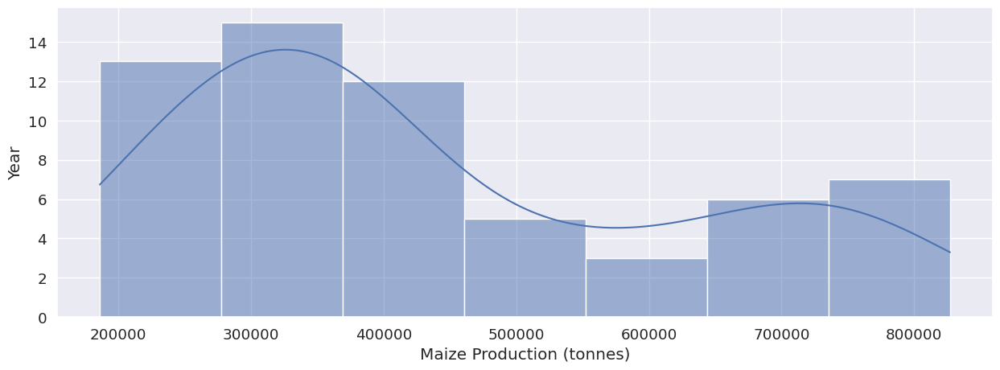

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


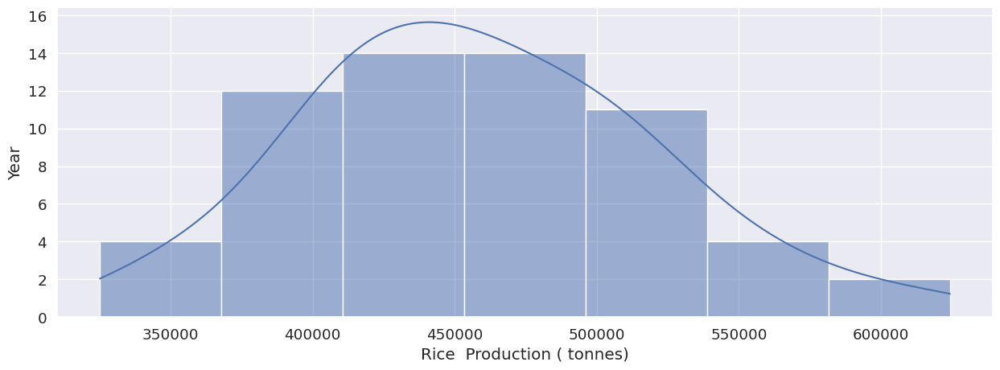

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


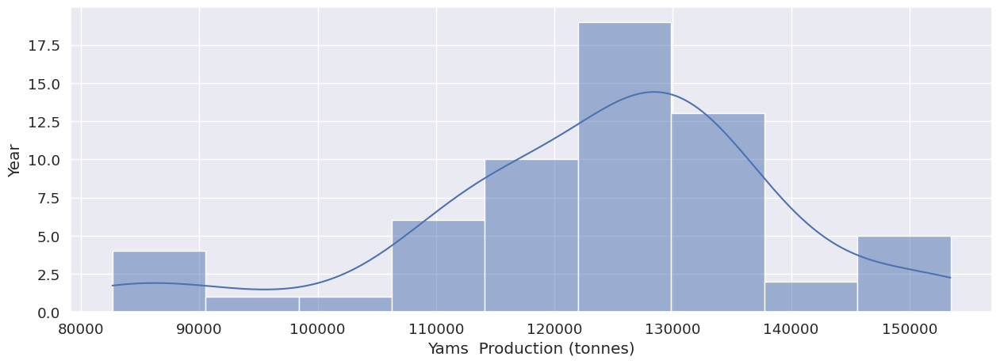

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


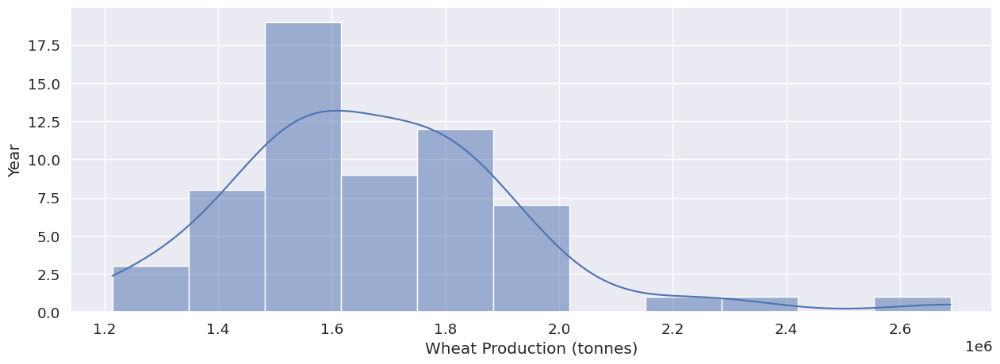

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


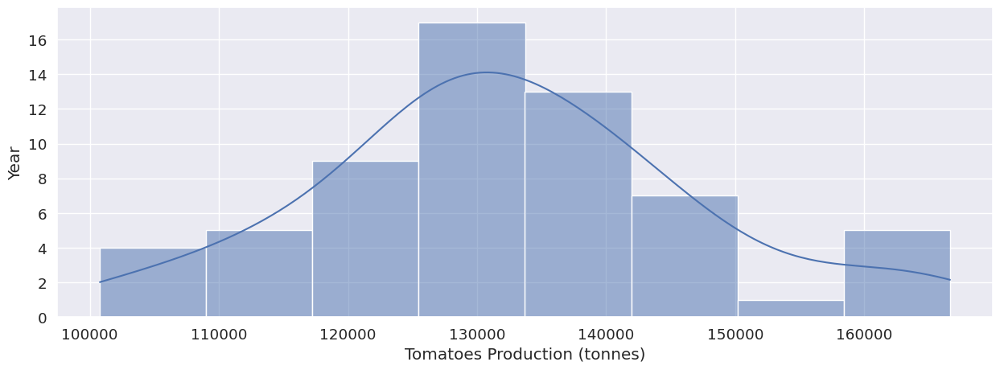

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


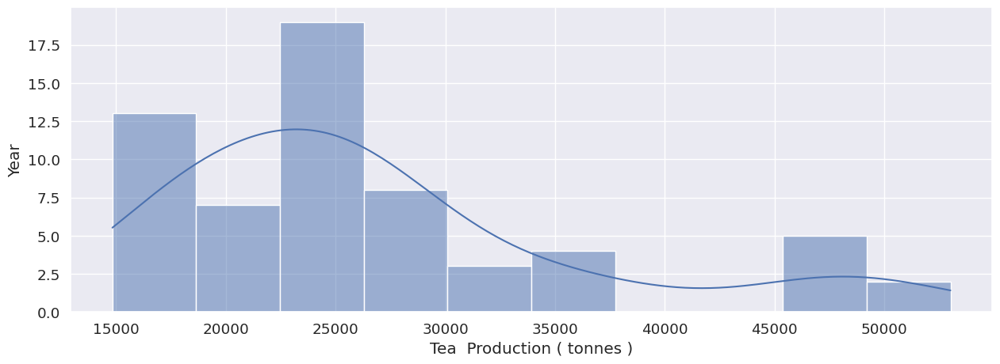

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


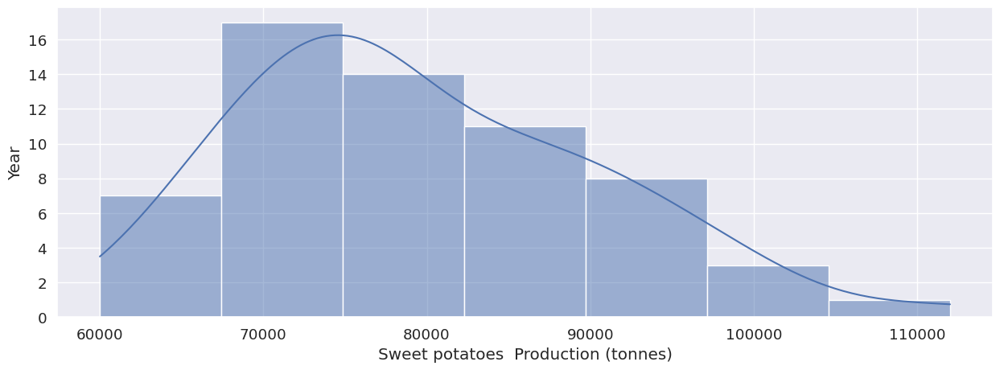

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


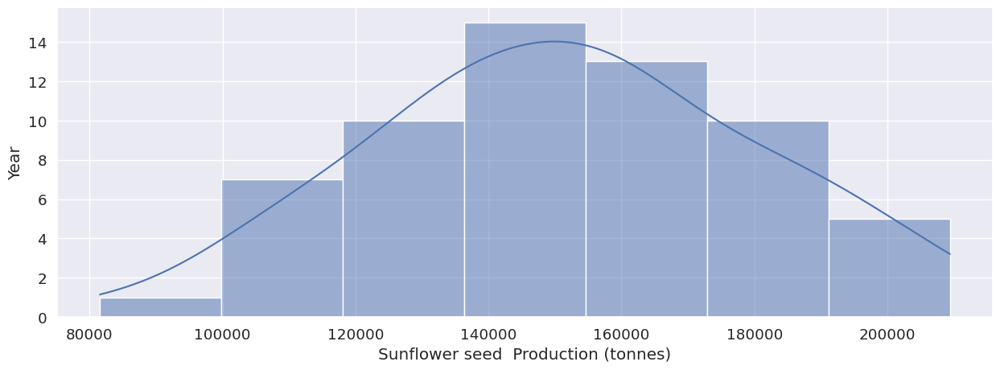

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


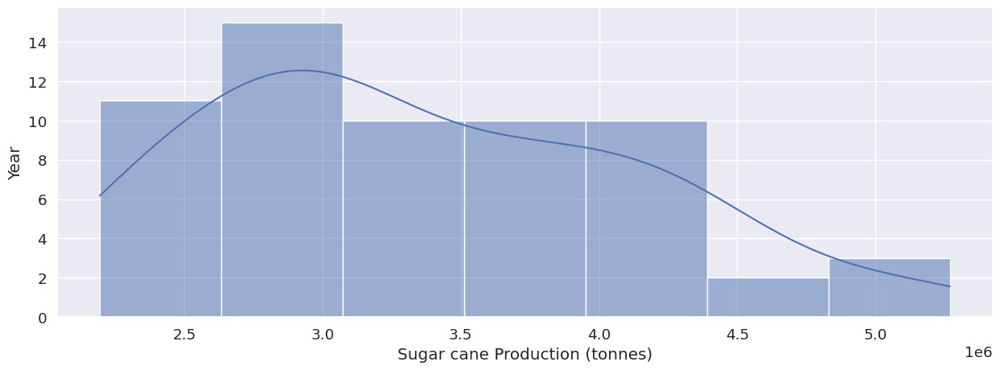

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


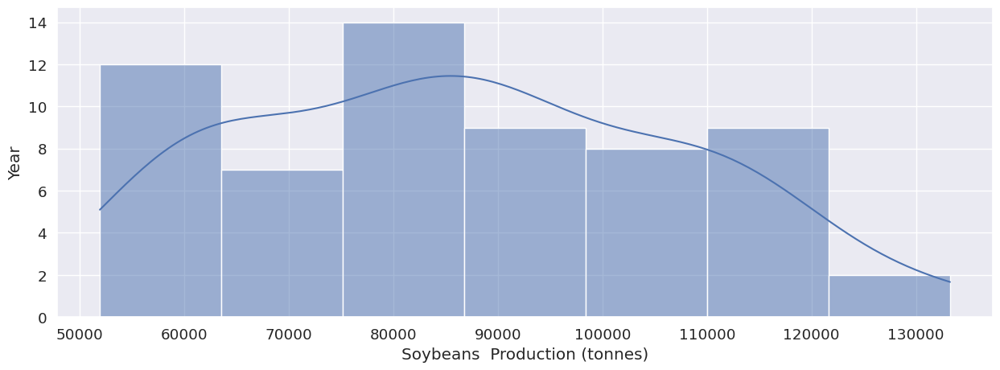

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


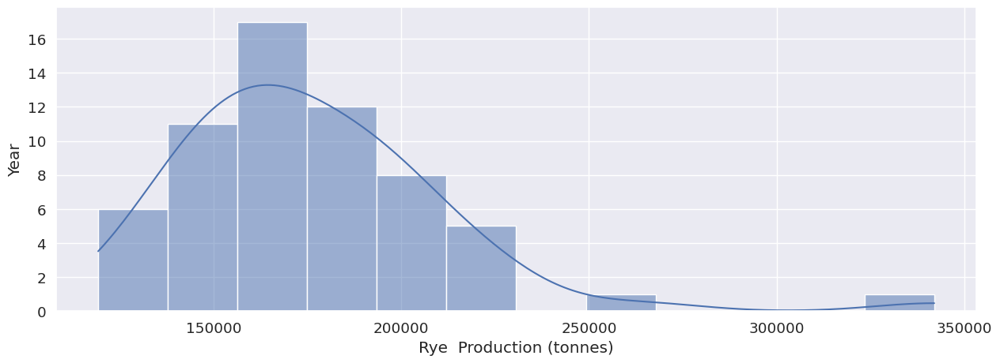

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


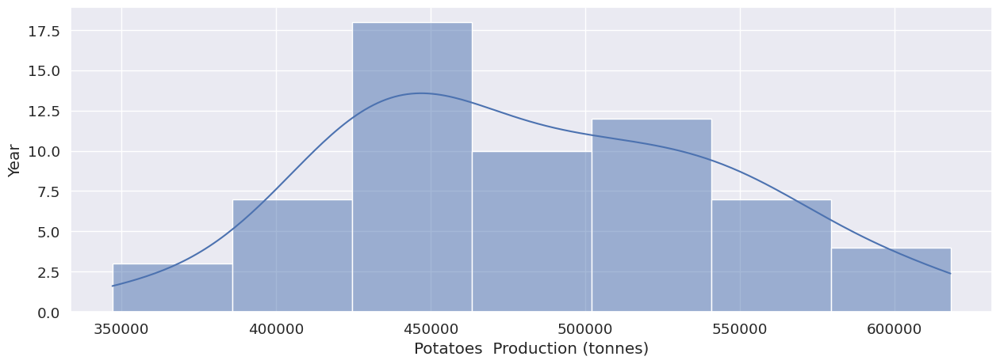

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


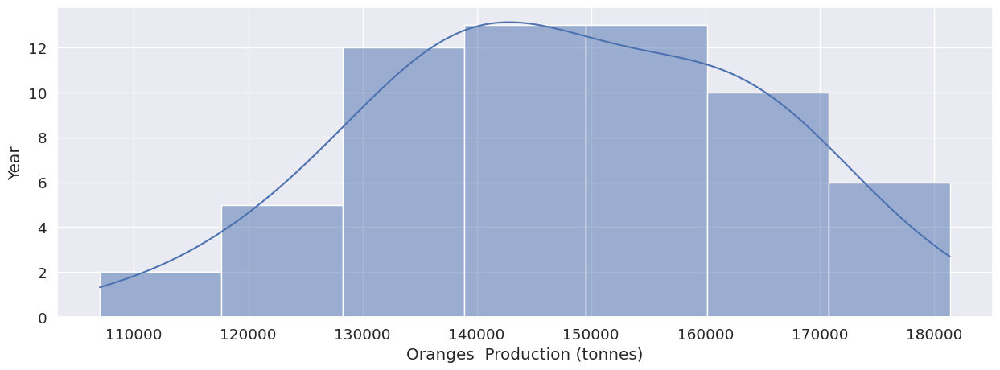

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


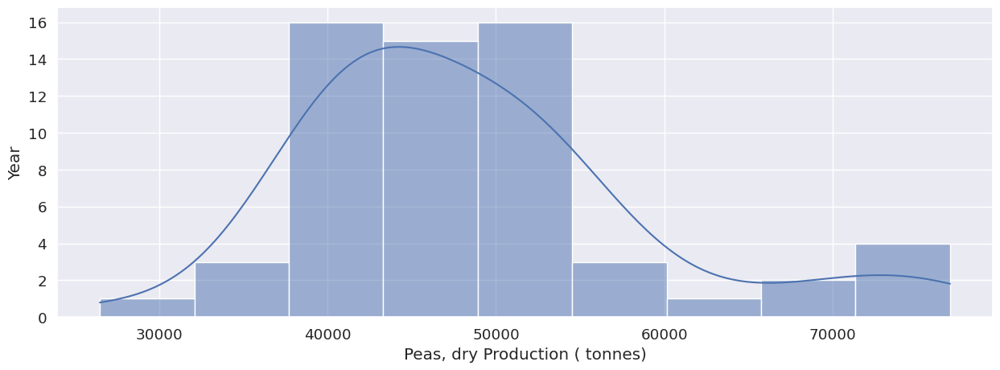

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


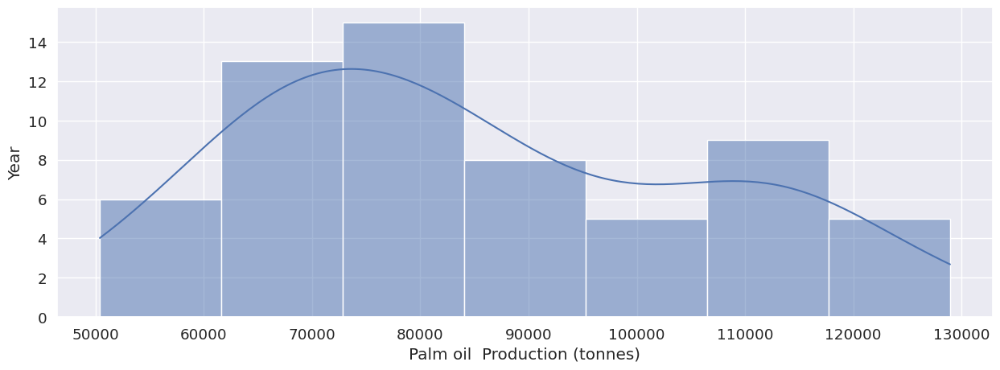

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


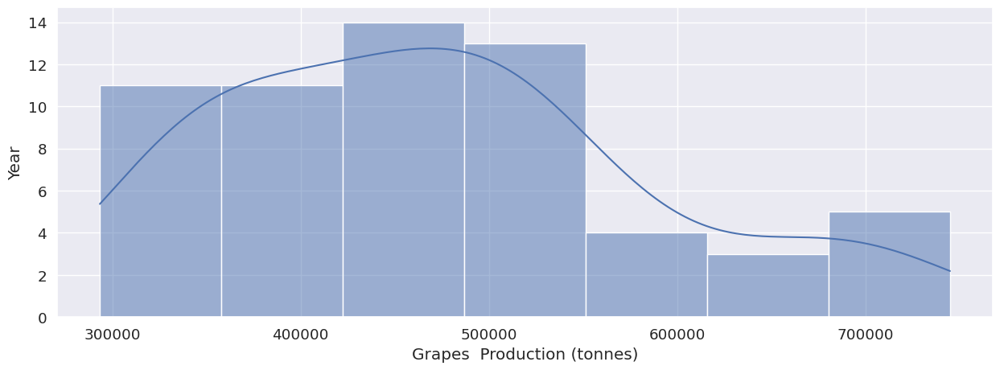

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


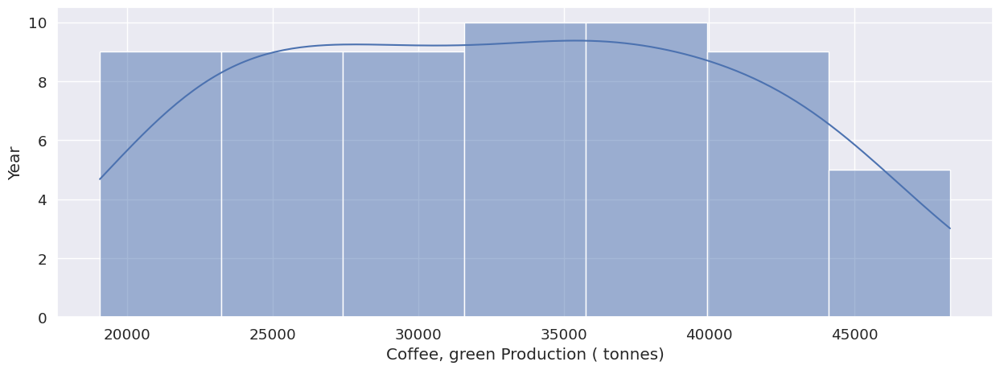

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


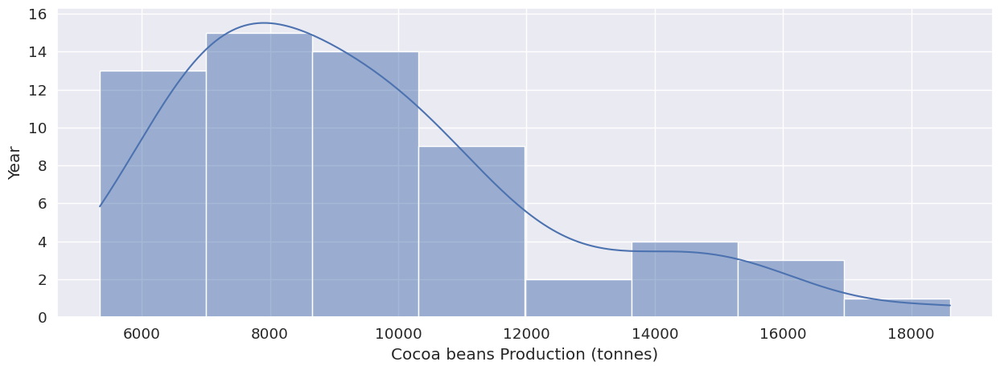

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


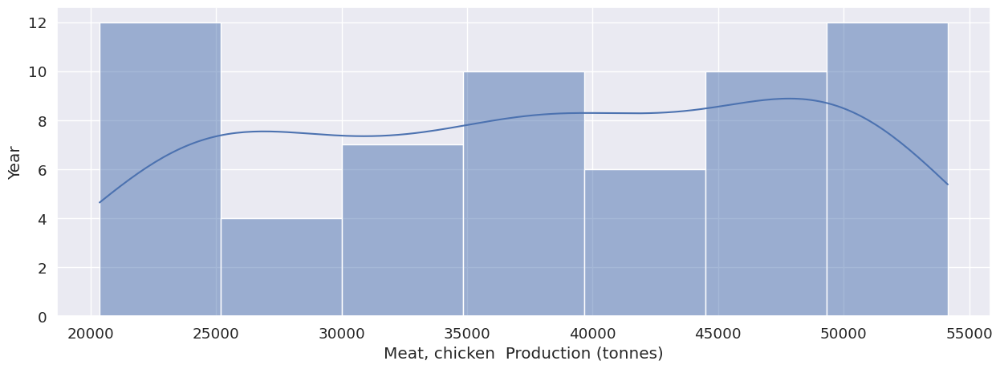

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


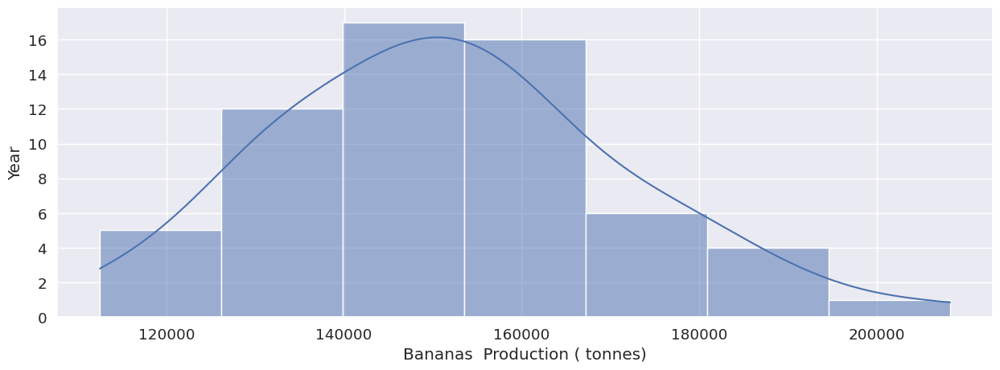

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


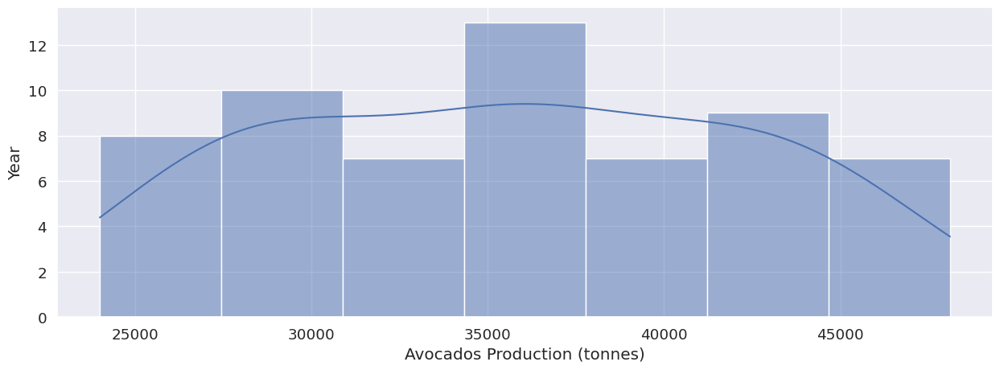

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


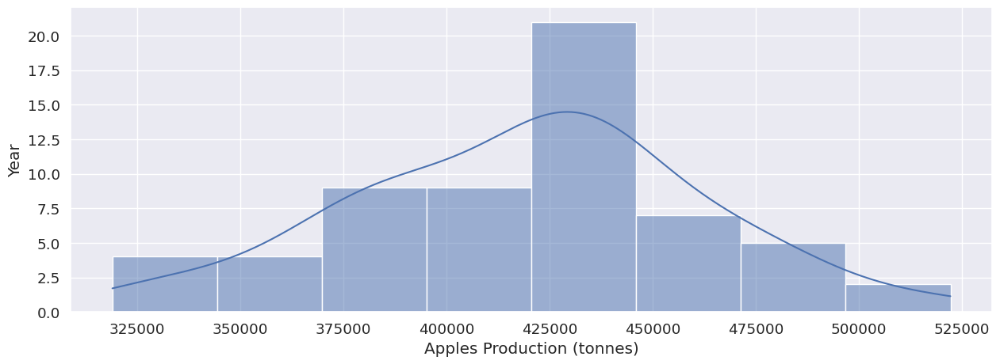

In [21]:
for i in median_production.columns:
    sns.set(rc={"figure.figsize" : [15,5]}, font_scale=1.2)
    sns.histplot(data=median_production[i],kde=True)
    plt.xlabel(i)
    plt.ylabel('Year')
    plt.show()

### This shows that most of the food production are right skewed distributed and majority of the times the production is around the median tonnes only

In [22]:
# Create the box plot
fig = px.box(
    raw_data[['Year', 'Maize Production (tonnes)',
       'Rice  Production ( tonnes)', 'Yams  Production (tonnes)']],
    color_discrete_sequence=px.colors.qualitative.Antique_r
)

# Customize the plot
fig.update_layout(
    title="<b>Box Plot For Numerical Columns",
    paper_bgcolor="lightgray",
    plot_bgcolor="white",
)

# Show the plot
fig.show()

In [23]:
# Create the box plot
fig = px.box(
    raw_data[['Wheat Production (tonnes)', 'Tomatoes Production (tonnes)',
       'Tea  Production ( tonnes )', 'Sweet potatoes  Production (tonnes)',
       'Sunflower seed  Production (tonnes)']],
    color_discrete_sequence=px.colors.qualitative.Antique_r
)

# Customize the plot
fig.update_layout(
    title="<b>Box Plot For Numerical Columns",
    paper_bgcolor="lightgray",
    plot_bgcolor="white",
)

# Show the plot
fig.show()

In [24]:
# Create the box plot
fig = px.box(
    raw_data[['Sugar cane Production (tonnes)',
       'Soybeans  Production (tonnes)', 'Rye  Production (tonnes)',
       'Potatoes  Production (tonnes)', 'Oranges  Production (tonnes)',
       'Peas, dry Production ( tonnes)', 'Palm oil  Production (tonnes)',
       'Grapes  Production (tonnes)', 'Coffee, green Production ( tonnes)',
       'Cocoa beans Production (tonnes)', 'Meat, chicken  Production (tonnes)',
       'Bananas  Production ( tonnes)', 'Avocados Production (tonnes)',
       'Apples Production (tonnes)']],
    color_discrete_sequence=px.colors.qualitative.Antique_r
)

# Customize the plot
fig.update_layout(
    title="<b>Box Plot For Numerical Columns",
    paper_bgcolor="lightgray",
    plot_bgcolor="white",
)

# Show the plot
fig.show()

 It proves that almost all the foods have outliers and there is not even single food which are proper